# **PART A**


---



> **DOMAIN:** Automobile


---



>   **CONTEXT:** The data concerns city-cycle fuel consumption in miles per gallon to be predicted in terms of 3 multivalued discrete and 5
continuous attributes.


---





> **DATA DESCRIPTION:**

---

* **cylinders:** multi-valued discrete
* **acceleration:** continuous
* **displacement:** continuous
* **model year:** multi-valued discrete
* **horsepower:** continuous
* **origin:** multi-valued discrete
* **weight:** continuous
* **car name:** string (unique for each instance)
* **mpg:** continuous


---



> **PROJECT OBJECTIVE:** To understand K-means Clustering by applying on the Car Dataset to segment the cars into various categories.


---



## **STEPS AND TASK:**


---



> ### **1. Data Understanding & Exploration:**


---



>> #### **A. Read ‘Car name.csv’ as a DataFrame and assign it to a variable.**


---



In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Define the file path
file_path = '/content/drive/My Drive/GREAT LEARNING MATERIALS/Module 5: Unsupervised learning/Project/Part1+-+Car+name.csv'

# Read the CSV file into a DataFrame
car_data = pd.read_csv(file_path)

In [4]:
# Display the first few rows of the DataFrame
car_data.head()

,car_name
0,chevrolet chevelle malibu
1,buick skylark 320
2,plymouth satellite
3,amc rebel sst
4,ford torino


In [5]:
car_data.shape

(398, 1)

>> #### **B. Read ‘Car-Attributes.json as a DataFrame and assign it to a variable.**


---



In [6]:
# Define the file path for the JSON file
json_file_path = '/content/drive/My Drive/GREAT LEARNING MATERIALS/Module 5: Unsupervised learning/Project/Part1+-+Car-Attributes.json'

# Read the JSON file into a DataFrame
car_attributes = pd.read_json(json_file_path)

In [7]:
# Display the first few rows of the DataFrame
car_attributes.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,18.0,8,307.0,130,3504,12.0,70,1
1,15.0,8,350.0,165,3693,11.5,70,1
2,18.0,8,318.0,150,3436,11.0,70,1
3,16.0,8,304.0,150,3433,12.0,70,1
4,17.0,8,302.0,140,3449,10.5,70,1


In [8]:
car_attributes.shape

(398, 8)

>> #### **C. Merge both the DataFrames together to form a single DataFrame.**


---



In [9]:
merged_data = pd.concat([car_data, car_attributes], axis=1)

In [10]:
# Display the merged DataFrame
merged_data.head()

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
0,chevrolet chevelle malibu,18.0,8,307.0,130,3504,12.0,70,1
1,buick skylark 320,15.0,8,350.0,165,3693,11.5,70,1
2,plymouth satellite,18.0,8,318.0,150,3436,11.0,70,1
3,amc rebel sst,16.0,8,304.0,150,3433,12.0,70,1
4,ford torino,17.0,8,302.0,140,3449,10.5,70,1


>> #### **D. Print 5 point summary of the numerical features and share insights.**


---



Let's check the datatypes of the columns.

In [11]:
merged_data.dtypes

car_name     object
mpg         float64
cyl           int64
disp        float64
hp           object
wt            int64
acc         float64
yr            int64
origin        int64
dtype: object

The 'hp' column appears to be a continuous variable, but the datatype is object. Let's check the unique values in 'hp' column to check the values.

In [12]:
merged_data['hp'].unique()

array([130, 165, 150, 140, 198, 220, 215, 225, 190, 170, 160, 95, 97, 85,
       88, 46, 87, 90, 113, 200, 210, 193, '?', 100, 105, 175, 153, 180,
       110, 72, 86, 70, 76, 65, 69, 60, 80, 54, 208, 155, 112, 92, 145,
       137, 158, 167, 94, 107, 230, 49, 75, 91, 122, 67, 83, 78, 52, 61,
       93, 148, 129, 96, 71, 98, 115, 53, 81, 79, 120, 152, 102, 108, 68,
       58, 149, 89, 63, 48, 66, 139, 103, 125, 133, 138, 135, 142, 77, 62,
       132, 84, 64, 74, 116, 82], dtype=object)

The 'hp' column has a value '?' which is not numerical and hence the column has object datatype.

Let's check the value counts of 'cyl' and 'origin' column as they are categorical discrete values.

In [13]:
merged_data['cyl'].value_counts()

4    204
8    103
6     84
3      4
5      3
Name: cyl, dtype: int64

In [14]:
merged_data['origin'].value_counts()

1    249
3     79
2     70
Name: origin, dtype: int64

In [15]:
merged_data.describe().T

,count,mean,std,min,25%,50%,75%,max
mpg,398.0,23.514573,7.815984,9.0,17.500,23.0,29.000,46.6
cyl,398.0,5.454774,1.701004,3.0,4.000,4.0,8.000,8.0
disp,398.0,193.425879,104.269838,68.0,104.250,148.5,262.000,455.0
wt,398.0,2970.424623,846.841774,1613.0,2223.750,2803.5,3608.000,5140.0
acc,398.0,15.568090,2.757689,8.0,13.825,15.5,17.175,24.8
yr,398.0,76.010050,3.697627,70.0,73.000,76.0,79.000,82.0
origin,398.0,1.572864,0.802055,1.0,1.000,1.0,2.000,3.0


**mpg (Miles Per Gallon):**

* The **mpg** column is a continuous column
* The average miles per gallon for the cars in the dataset is around 23.5, with a standard deviation of approximately 7.8.
* The minimum observed value is 9.0 mpg, while the maximum reaches 46.6 mpg.
* Most values lie between 17.5 and 29.0 mpg (25th to 75th percentile).
* The mean (23.51) is almost equal to the median (23), indicating an almost symmetrical distribution with slight right skew.

**cyl (Cylinders):**

* The **Cylinders** column is a multi valued discrete column and not a continuous one.
* The average number of cylinders is approximately 5.45, with a standard deviation of 1.7.
* The dataset covers cars with cylinder counts ranging from 3 to 8.
* Majority of cars have either 4, 6, or 8 cylinders, with the most frequent quartiles being 4 and 8.
* The mean (5.45) is greater than median (4), suggesting right skew i.e more values being on the lower side.

**disp (Engine Displacement):**

* The **disp** column is a continuous column.
* The average engine displacement is around 193.4 cubic inches, with a significant standard deviation of approximately 104.3.
* Engine displacements vary widely, ranging from 68.0 to 455.0 cubic inches.
* Most engine displacements fall between 104.25 and 262.0 cubic inches (25th to 75th percentile).
* The mean (193.42) is quite greater than median (148.5), suggesting right skewness.

**wt (Car Weight):**

* The **wt** column is a continuous column.
* The average car weight is approximately 2970.4 lbs, with a standard deviation of about 846.8 lbs.
* Car weights range from 1613.0 to 5140.0 lbs.
* The majority of car weights lie between 2223.75 and 3608.0 lbs (25th to 75th percentile).
* The mean (2970.424623) is greater than the median (2803.5) suggesting right skewness.

**acc (Acceleration):**

* The **acc** column is continuous.
* The average acceleration is around 15.6 seconds for 0 to 60 mph, with a standard deviation of about 2.8 seconds.
* Acceleration times vary from 8.0 to 24.8 seconds.
* Most acceleration times fall between 13.825 and 17.175 seconds (25th to 75th percentile).
* The mean (15.57) is quite close to the median (15.5) suggesting a symmetrical distribution.


**yr (model year):**

* The **yr** is a multi-valued discrete column.
* The dataset covers cars manufactured from 70 to 82, with an average year of around 76.
* Most cars in the dataset were manufactured between 73 and 79 (25th to 75th percentile).
* The mean model year (76.01) is quite close to the median (76) suggesting a symmetrical distribution.

**origin:**

* The **origin** is a multi-valued discrete column.
* The 'origin' column likely represents the origin of the car's manufacturing.
* The dataset seems to have cars originating from three different regions (1, 2, 3) with a majority from region 1 and some from region 2 and 3.
* The mean of the column is 1.57, while the median is 1 suggesting right skewness, i.e a significant no of cars belong to 1, while few are relatively few are from 2 and 3.

**hp (horsepower)**

* Th **hp** column is a continuous column.
* However it has missing values and contains **'?'** as entries, which is why the dataype of the column is **object**.
* We will require to treat these values and change the column to a numerical datatype.

> ### **2. Data Preparation & Analysis:**


---



>> #### **A. Check and print feature-wise percentage of missing values present in the data and impute with the best suitable approach.**


---



In [16]:
# Check for missing values in the merged dataset
missing_values = merged_data.isnull().sum()

# Calculate the percentage of missing values for each feature
percentage_missing = (missing_values / len(merged_data)) * 100

In [17]:
# Print the percentage of missing values for each feature
percentage_missing

car_name    0.0
mpg         0.0
cyl         0.0
disp        0.0
hp          0.0
wt          0.0
acc         0.0
yr          0.0
origin      0.0
dtype: float64

There appear no missing values in the datasets. However, the **hp** column has some **'?'** entries wchich can be considered missing values and will be treated in **section 2.H**.

>> #### **B. Check for duplicate values in the data and impute with the best suitable approach.**


---



In [18]:
# Check for duplicate rows in the dataset
duplicate_rows = merged_data.duplicated()

# Count the number of duplicate rows
num_duplicates = duplicate_rows.sum()

# Print the number of duplicate rows, if any
if num_duplicates > 0:
    print(f"Number of duplicate rows: {num_duplicates}")
else:
    print("No duplicate rows found.")

No duplicate rows found.


There are no duplicated rows in the data.


---



>> #### **C. Plot a pairplot for all features.**


---



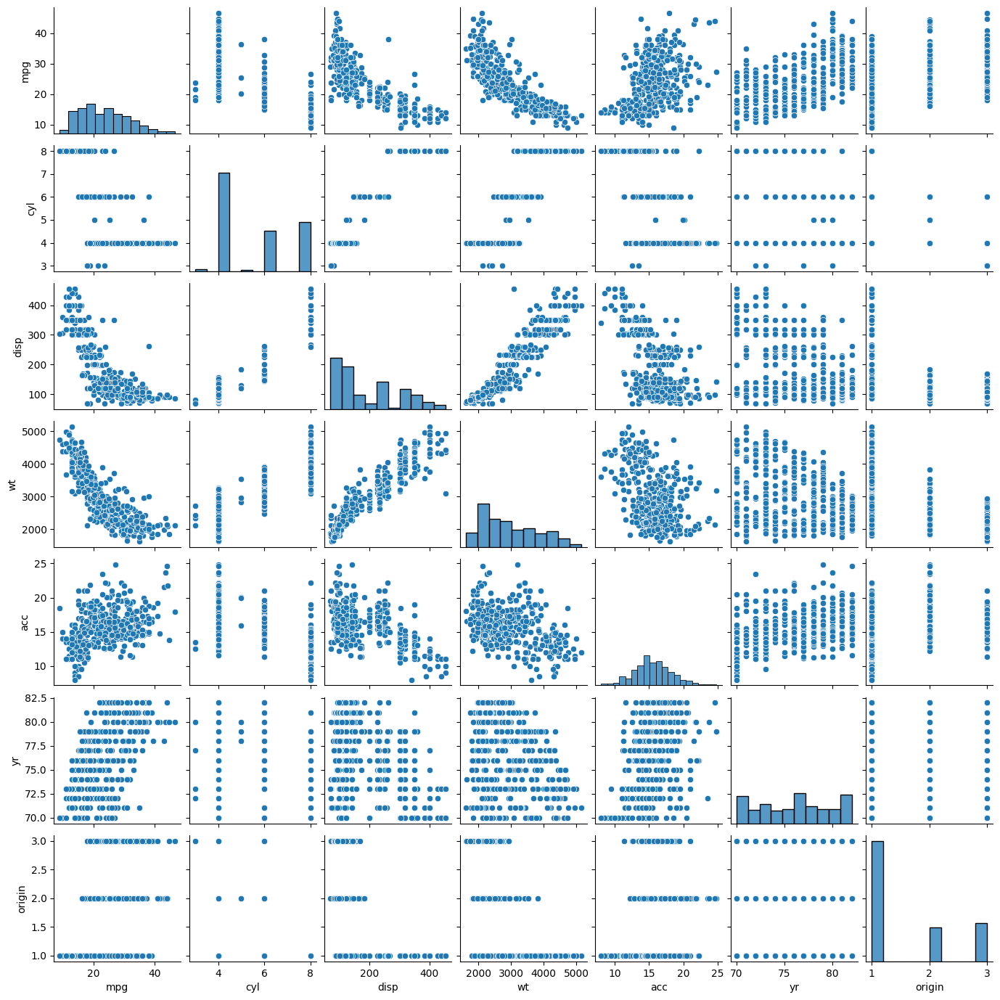

In [ ]:
# Create a pairplot for all numerical features

sns.pairplot(merged_data, height=2)
plt.show()

There appears to be strong positive correlation between certain variables such as **disp** and **wt** and strong negative correlation between variables such as **mpg** and **wt**, and **mpg** and **disp**.

>> #### **D. Visualize a scatterplot for ‘wt’ and ‘disp’. Datapoints should be distinguishable by ‘cyl’.**


---



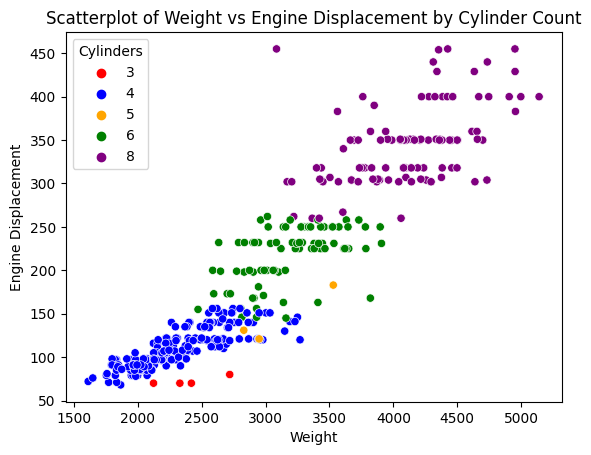

In [19]:
# Custom colors for 'cyl' values
custom_colors = {3: 'red', 4: 'blue', 5: 'orange', 6: 'green', 8: 'purple'}

# Create a scatterplot for 'wt' vs 'disp' with points distinguished by 'cyl' using the custom palette
sns.scatterplot(x='wt', y='disp', hue='cyl', data=merged_data, palette=custom_colors)
plt.title('Scatterplot of Weight vs Engine Displacement by Cylinder Count')
plt.xlabel('Weight')
plt.ylabel('Engine Displacement')
plt.legend(title='Cylinders')
plt.show()

In [20]:
merged_data['cyl'].value_counts()

4    204
8    103
6     84
3      4
5      3
Name: cyl, dtype: int64

>> #### **E. Share insights for Q2.d.**


---



* The **wt** and **disp** columns are positively correlated.
* There appears to be 3 significant  and distinct clusters.
* There are only 4 entries where no of cylinders = 3. The weight for these cars range between 2000 to 3000 with almost constant displacement between 50 and 100.
* There are only 3 entries where no of cylinders = 5. The weight for these cars range between 2500 to 4000, while the displacement ranges between 100 and 200.
* There are significant no of entries with no of cylinders equal to 4, 6 and 8, and they form separate distinct clusters along different portions of the plot.
* The entries with no of cylinders = 4 occupy the lower left region of the plot, with weights ranging from 1500 to 3500 and displacement ranging from 50 to slightly above 150.
* The entries with no of cylinders = 6 occupy the middle region of the plot, with weights ranging from 2500 to 4000 and displacement ranging from approximately 150 to  250.
* The entries with no of cylinders = 8 occupy the upper right region of the plot, with weights ranging from approximately 3000 to 5000 and displacement ranging from approximately 250 to 450.

>> #### **F. Visualize a scatterplot for ‘wt’ and ’mpg’. Datapoints should be distinguishable by ‘cyl’.**


---



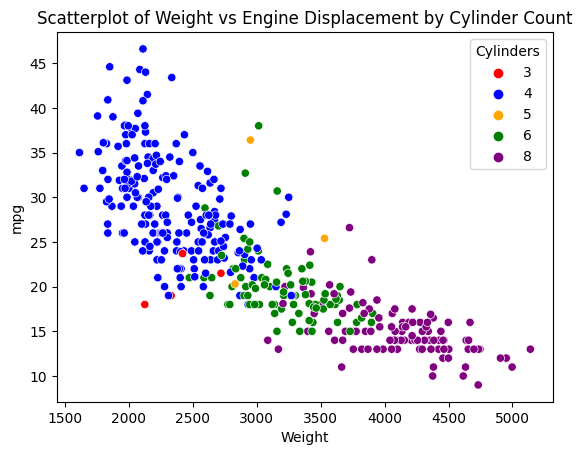

In [21]:
# Custom colors for 'cyl' values
custom_colors = {3: 'red', 4: 'blue', 5: 'orange', 6: 'green', 8: 'purple'}

# Create a scatterplot for 'wt' vs 'disp' with points distinguished by 'cyl' using custom colors
sns.scatterplot(x='wt', y='mpg', hue='cyl', data=merged_data, palette=custom_colors)
plt.title('Scatterplot of Weight vs Engine Displacement by Cylinder Count')
plt.xlabel('Weight')
plt.ylabel('mpg')
plt.legend(title='Cylinders')
plt.show()

>> #### **G. Share insights for Q2.f.**


---



* The **wt** and **mpg** columns are negatively correlated.
* While here too, there appears to be 3 significant clusters of entries with different no of cylinders, there is comparatively more overlapping compared to **wt** and **disp**.
* There are only 4 entries where no of cylinders = 3. The weight for these cars range between 2000 to 3000, the mpg (miles per gallon) varies between 15 and 25.
* There are only 3 entries where no of cylinders = 5. The weight for these cars range between 2500 to 4000, while the mpg ranges between 20 and 40.
* There are significant no of entries with no of cylinders equal to 4, 6 and 8, and they form separate clusters along different portions of the plot, but with overlapping.
* The entries with no of cylinders = 4 occupy the upper left region of the plot, with weights ranging from 1500 to 3500 and mpg ranging from 20 to 50.
* The entries with no of cylinders = 6 occupy the lower middle region of the plot, with weights ranging from 2500 to 4000 and mpg for most ranging from  15 to 30, with some upto 40.
* The entries with no of cylinders = 8 occupy the lower right region of the plot, with weights ranging from approximately 3000 to 5000 and displacement ranging from approximately 10 to 25.

>> #### **H. Check for unexpected values in all the features and datapoints with such values.**


>> ```
[Hint: ‘?’ is present in ‘hp’]
```


>> Here as the hint given there is an unwanted data '?' present in the 'hp' variable. So here you have to
find those values and convert them to nulls then you can drop those values using drop function.

---



In [22]:
import numpy as np

Let's check the rows where hp = '?'.

In [23]:
merged_data[merged_data['hp'] == '?']

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
32,ford pinto,25.0,4,98.0,?,2046,19.0,71,1
126,ford maverick,21.0,6,200.0,?,2875,17.0,74,1
330,renault lecar deluxe,40.9,4,85.0,?,1835,17.3,80,2
336,ford mustang cobra,23.6,4,140.0,?,2905,14.3,80,1
354,renault 18i,34.5,4,100.0,?,2320,15.8,81,2
374,amc concord dl,23.0,4,151.0,?,3035,20.5,82,1


Let's convert the unwanted values to null (NaN).

In [24]:
# Find rows where 'hp' column contains '?'
rows_with_unexpected_hp = merged_data[merged_data['hp'] == '?']

# Convert '?' values in 'hp' column to NaN
merged_data['hp'].replace('?', np.nan, inplace=True)

Now let's calculate percentage missing values in the 'hp' column.

In [25]:
# Check for missing values in the merged dataset
missing_values = merged_data['hp'].isnull().sum()

# Calculate the percentage of missing values for each feature
percentage_missing = (missing_values / len(merged_data)) * 100

In [26]:
percentage_missing

1.507537688442211

Since the percentage missing values is very small, we will drop the rows with null values.

In [27]:
merged_data.shape

(398, 9)

In [28]:
#dropping the rows with null values.
merged_data.dropna(inplace=True)

In [29]:
merged_data.shape

(392, 9)

> ### **3. Clustering:**


---



>> #### **A. Apply K-Means clustering for 2 to 10 clusters.**


---



We will drop 'car_name' column.

In [30]:
df = merged_data.drop('car_name', axis=1)

Moreover, origin is categorical column with three vales: 1, 2 and 3. It probably denotes place of origin of the car and hence it is not an ordinal column, but a nominal one. Hence, we will use one hot encoding to encode the origin column.

In [31]:
# Create a new DataFrame with the 'origin' column one-hot encoded
origin_dummies = pd.get_dummies(df['origin'], prefix='origin')

# Concatenate the one-hot encoded 'origin' columns to the existing 'df'
df = pd.concat([df, origin_dummies], axis=1)

# Drop the original 'origin' column if needed
df = df.drop('origin', axis=1)

In [32]:
df.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin_1,origin_2,origin_3
0,18.0,8,307.0,130.0,3504,12.0,70,1,0,0
1,15.0,8,350.0,165.0,3693,11.5,70,1,0,0
2,18.0,8,318.0,150.0,3436,11.0,70,1,0,0
3,16.0,8,304.0,150.0,3433,12.0,70,1,0,0
4,17.0,8,302.0,140.0,3449,10.5,70,1,0,0


In [33]:
from sklearn.model_selection  import train_test_split
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist

# Suppress future warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [34]:
from sklearn.preprocessing import StandardScaler

# Assuming 'df' is your DataFrame

sc = StandardScaler()
df_scaled = sc.fit_transform(df)  # df is transformed into a NumPy array

# Convert the scaled NumPy array back to a DataFrame
df_scaled = pd.DataFrame(df_scaled, columns=df.columns)

df_scaled.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin_1,origin_2,origin_3
0,-0.698638,1.483947,1.077290,0.664133,0.620540,-1.285258,-1.625315,0.774597,-0.458123,-0.50239
1,-1.083498,1.483947,1.488732,1.574594,0.843334,-1.466724,-1.625315,0.774597,-0.458123,-0.50239
2,-0.698638,1.483947,1.182542,1.184397,0.540382,-1.648189,-1.625315,0.774597,-0.458123,-0.50239
3,-0.955212,1.483947,1.048584,1.184397,0.536845,-1.285258,-1.625315,0.774597,-0.458123,-0.50239
4,-0.826925,1.483947,1.029447,0.924265,0.555706,-1.829655,-1.625315,0.774597,-0.458123,-0.50239


In [35]:
clusters=range(2,11)
wcss =[]

for k in clusters:
    model=KMeans(n_clusters=k, random_state = 42)
    model.fit(df_scaled)
    wcss.append(model.inertia_)

>> #### **B. Plot a visual and find elbow point.**


---



Text(0.5, 1.0, 'Selecting k with the Elbow Method')

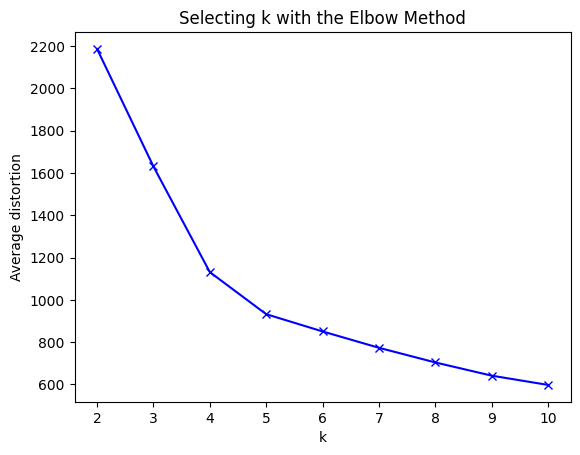

In [36]:
plt.plot(clusters, wcss, 'bx-')
plt.xlabel('k')
plt.ylabel('Average distortion')
plt.title('Selecting k with the Elbow Method')

From the above diagram, we may consider 5 as an elbow considering that visually the change in WCSS from 5 clusters onwards appears less comparatively.

Let's create a dataframe to calculate absolute change and percentage of total change contributed as we increase clusters.

In [37]:
# Calculate absolute differences between successive WCSS values
absolute_diffs = [abs(wcss[i] - wcss[i - 1]) for i in range(1, len(wcss))]

# Calculate total change in WCSS
total_change = sum(absolute_diffs)

# Calculate percentage changes relative to total change
percentage_changes = [(diff / total_change) * 100 for diff in absolute_diffs]

# Create a DataFrame with clusters as index to store both absolute differences and percentage changes
data = {
    'Absolute Difference': absolute_diffs,
    'Percentage Change (%)': percentage_changes
}

df_changes = pd.DataFrame(data, index=clusters[:-1])  # Set clusters as index starting from the second value

# Display the DataFrame
df_changes

,Absolute Difference,Percentage Change (%)
2,555.980020,34.980341
3,499.653819,31.436491
4,199.082669,12.525593
5,81.676482,5.138802
6,77.274835,4.861865
7,69.377429,4.364988
8,62.458077,3.929646
9,43.903773,2.762274


From 5 clusters onwards, the percentage change in WCSS is low. So we may consider 5 clusters as optimum.

>> #### **C. On the above visual, highlight which are the possible Elbow points.**


---



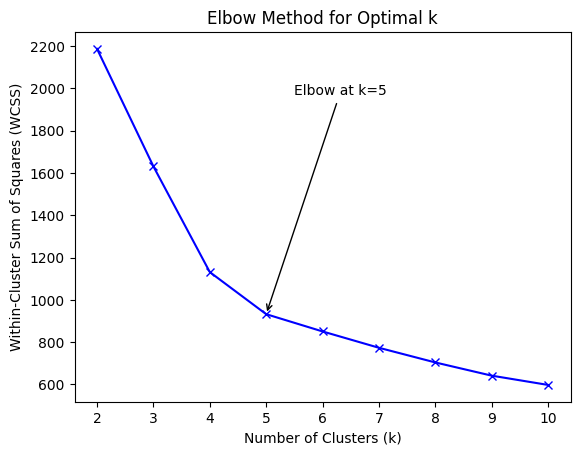

In [38]:
# Plotting the Elbow Method
plt.plot(clusters, wcss, 'bx-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.title('Elbow Method for Optimal k')

# Defining the potential elbow point at cluster 5
potential_elbow = 5

# Highlighting the potential elbow point at cluster 5
index = clusters.index(potential_elbow)
plt.annotate(f'Elbow at k={potential_elbow}', xy=(potential_elbow, wcss[index]),
             xytext=(potential_elbow + 0.5, max(wcss) - max(wcss) * 0.1),
             arrowprops=dict(facecolor='black', arrowstyle='->'))

plt.show()


In this case, let's consider the potential elbow point at 5 clusters, as beyond this point, the reduction in the percentage change becomes less significant compared to the changes observed when going from 2 to 4 clusters.

>> #### **D. Train a K-means clustering model once again on the optimal number of clusters.**


---



In [39]:
# Let us first start with K = 5
final_model=KMeans(n_clusters=5, random_state = 42)

In [40]:
final_model.fit(df_scaled)

KMeans(n_clusters=5, random_state=42)

In [41]:
#predicting using the model.
prediction=final_model.predict(df_scaled)

Let's check the centroids of the model.

In [42]:
centroids = final_model.cluster_centers_
centroids

array([[-1.15155766,  1.48394702,  1.48591152,  1.49929313,  1.38738246,
        -1.06597113, -0.66682598,  0.77459667, -0.45812285, -0.50239045],
       [ 0.58942851, -0.78469056, -0.62905742, -0.56586944, -0.61920955,
         0.27583675,  0.6079378 ,  0.77459667, -0.45812285, -0.50239045],
       [-0.54570727,  0.43354361,  0.39302151, -0.10051822,  0.36936232,
         0.41908617, -0.09816998,  0.77459667, -0.45812285, -0.50239045],
       [ 0.53329037, -0.76905927, -0.81120732, -0.62199011, -0.64140253,
         0.45467702, -0.08239151, -1.29099445,  2.18282063, -0.50239045],
       [ 0.89861109, -0.80457152, -0.87745421, -0.64080755, -0.89159482,
         0.22894623,  0.3977799 , -1.29099445, -0.45812285,  1.99048369]])

In [43]:
#Calculate the centroids for the columns to profile
centroid_df = pd.DataFrame(centroids, columns = list(df_scaled) )
centroid_df

,mpg,cyl,disp,hp,wt,acc,yr,origin_1,origin_2,origin_3
0,-1.151558,1.483947,1.485912,1.499293,1.387382,-1.065971,-0.666826,0.774597,-0.458123,-0.502390
1,0.589429,-0.784691,-0.629057,-0.565869,-0.619210,0.275837,0.607938,0.774597,-0.458123,-0.502390
2,-0.545707,0.433544,0.393022,-0.100518,0.369362,0.419086,-0.098170,0.774597,-0.458123,-0.502390
3,0.533290,-0.769059,-0.811207,-0.621990,-0.641403,0.454677,-0.082392,-1.290994,2.182821,-0.502390
4,0.898611,-0.804572,-0.877454,-0.640808,-0.891595,0.228946,0.397780,-1.290994,-0.458123,1.990484


>> #### **E. Add a new feature in the DataFrame which will have labels based upon cluster value.**


---



In [44]:
#Append the prediction
merged_data["Cluster_label"] = prediction
df["Cluster_label"] = prediction
merged_data.head()

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin,Cluster_label
0,chevrolet chevelle malibu,18.0,8,307.0,130.0,3504,12.0,70,1,0
1,buick skylark 320,15.0,8,350.0,165.0,3693,11.5,70,1,0
2,plymouth satellite,18.0,8,318.0,150.0,3436,11.0,70,1,0
3,amc rebel sst,16.0,8,304.0,150.0,3433,12.0,70,1,0
4,ford torino,17.0,8,302.0,140.0,3449,10.5,70,1,0


Let's check the value counts of the clusters.

In [45]:
merged_data['Cluster_label'].value_counts()

0    95
4    79
2    76
1    74
3    68
Name: Cluster_label, dtype: int64

Let's check the clusterwise mean for various parameters to understand specific characteristics for each cluster.

In [46]:
# Group the data by 'Cluster_label' and calculate the mean for each cluster
clusterwise_data = merged_data.groupby('Cluster_label').mean().reset_index()

# Exclude 'car_name' column if present
if 'car_name' in clusterwise_data.columns:
    clusterwise_data = clusterwise_data.drop('car_name', axis=1)

# Display the cluster-wise data for all columns except 'car_name'
clusterwise_data

,Cluster_label,mpg,cyl,disp,hp,wt,acc,yr,origin
0,0,14.469474,8.000000,349.705263,162.105263,4154.526316,12.604211,73.526316,1.0
1,1,28.040541,4.135135,128.668919,82.716216,2452.297297,16.301351,78.216216,1.0
2,2,19.192105,6.210526,235.486842,100.605263,3290.921053,16.696053,75.618421,1.0
3,3,27.602941,4.161765,109.632353,80.558824,2433.470588,16.794118,75.676471,2.0
4,4,30.450633,4.101266,102.708861,79.835443,2221.227848,16.172152,77.443038,3.0


In [47]:
clusterwise_data[['cyl','origin']]

,cyl,origin
0,8.000000,1.0
1,4.135135,1.0
2,6.210526,1.0
3,4.161765,2.0
4,4.101266,3.0


The main difference between the clusters are based on no of cylinders and origin. Cluster 0 and cluster 2 have average no of cylinders as 8 and 6 respectively and are different from the other clusters 1, 3, and 4 which have average number of cylinders as 4. While clusters 1,3 and 4 are similar as per other parameters, they differ in terms of place of origin. Cluster 1 has origin 1, cluster 3 has origin 2 and cluster 4 has origin 3.

Let's create a pivot table to further understand the distribution across clusters based on **cylinder** and **origin** column.

In [48]:
pivot_table = merged_data.pivot_table(index=['cyl','origin'], columns='Cluster_label', aggfunc='size', fill_value=0)
pivot_table

Cluster_label   0   1   2   3   4
cyl origin                       
3   3           0   0   0   0   4
4   1           0  69   0   0   0
    2           0   0   0  61   0
    3           0   0   0   0  69
5   2           0   0   0   3   0
6   1           0   5  68   0   0
    2           0   0   0   4   0
    3           0   0   0   0   6
8   1          95   0   8   0   0

The pivot table helps us understand the characteristics of the cluster better.
* Cluster 0 has all 95 values with no of cylinders as 8 and origin 1.
* Cluster 1 has 69 out of 74 values with no of cylinders as 4 and origin 1.
* Cluster 2 has 68 out of 76 values with no of cylinders as 6 and origin 1.
* Cluster 3 has 61 out of 68 values with no of cylinders as 4 and origin 2.
* Cluster 4 has 69 out of 79 values with no of cylinders as 4 and origin 3.

>> #### **F. Plot a visual and color the datapoints based upon clusters.**


---



Let's create a stacked bar chart based on the pivot table above to visualize the clusters.

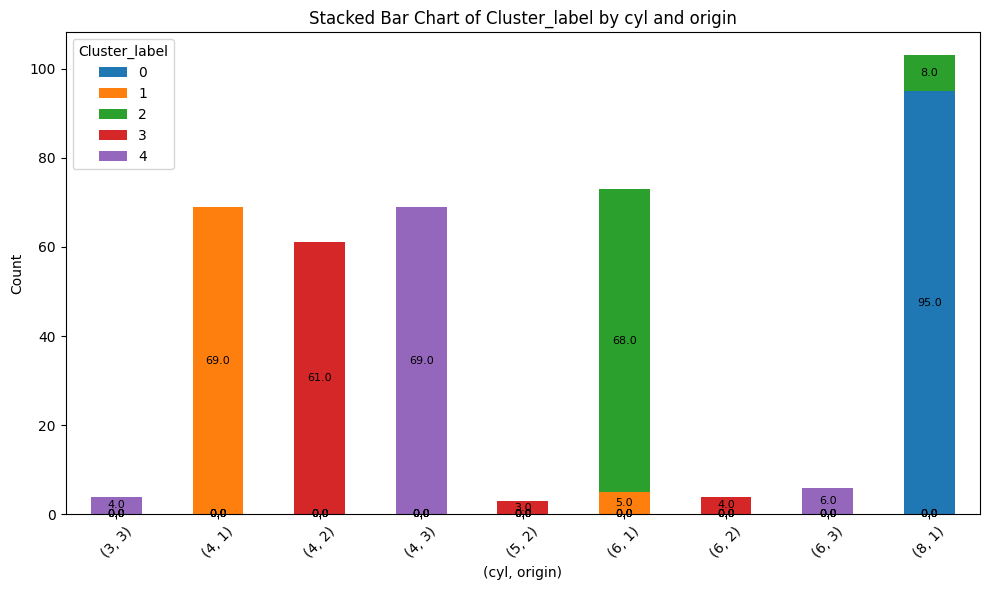

In [49]:
# Plotting the stacked bar chart
ax = pivot_table.plot(kind='bar', stacked=True, figsize=(10, 6))

plt.xlabel('(cyl, origin)')
plt.ylabel('Count')
plt.title('Stacked Bar Chart of Cluster_label by cyl and origin')
plt.legend(title='Cluster_label', loc='upper left')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Adding value annotations on each section of the bars
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy()
    ax.text(x + width / 2, y + height / 2, f'{height}', ha='center', va='center', fontsize=8)

plt.tight_layout()
plt.show()

We can clearly visualize the 5 clusters and see five major groups based on origin and cylinder.

Let's plot a interactive 3D plot using plotly to visualize the clusters.

In [50]:
import plotly.express as px

# Create a 3D scatter plot using Plotly Express
fig = px.scatter_3d(merged_data, x='cyl', y='origin', z='Cluster_label', color='Cluster_label', symbol='Cluster_label')
fig.update_layout(
    title='3D Scatter Plot of cyl, origin, and Cluster_label',
    legend=dict(
        x=0,
        y=1,
        traceorder='normal',
        font=dict(
            family='sans-serif',
            size=12,
            color='black'
        ),
        bgcolor='LightSteelBlue',
        bordercolor='black',
        borderwidth=1
    )
)
fig.show()

We can clearly visualize the 5 clusters from the 3D diagram.

Let's create a paiplot to check the relationship among different variables across clusters.

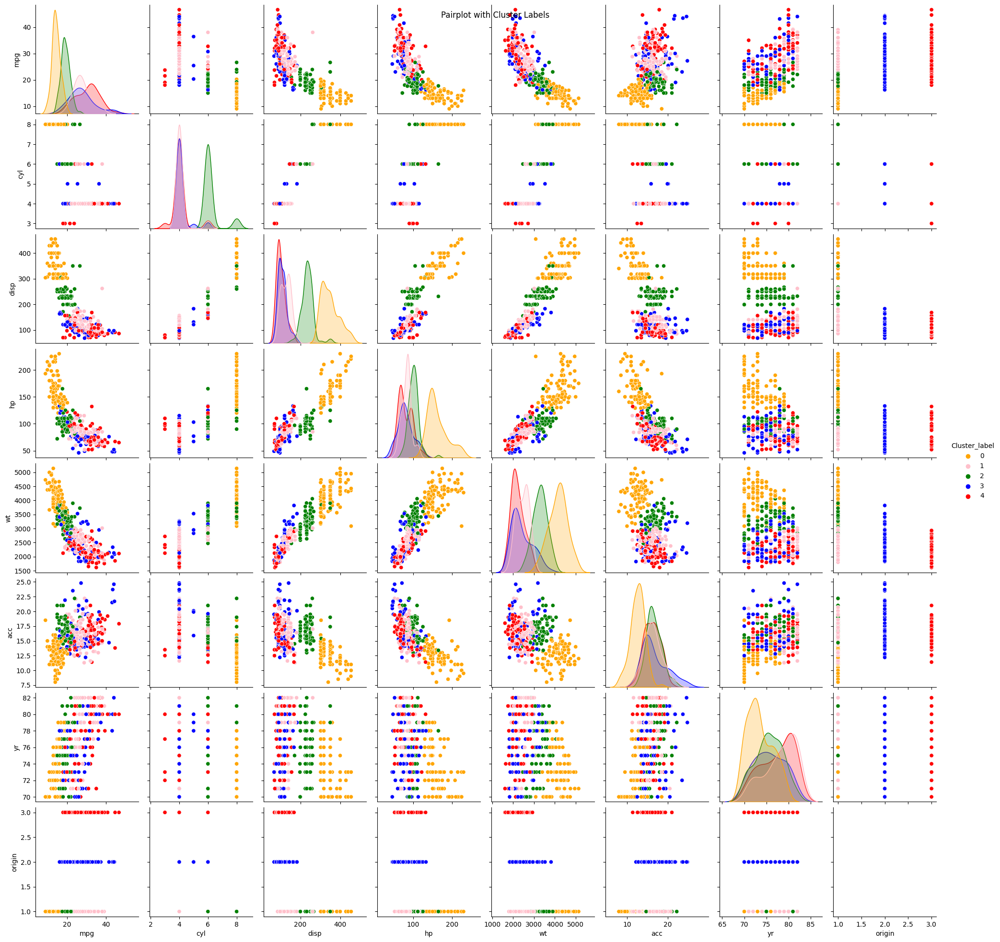

In [ ]:
# Define custom colors for each cluster label
cluster_colors = {0: 'orange', 1: 'pink', 2: 'green', 3: 'blue', 4: 'red'}
#cluster_colors = {0: 'orange', 1: 'pink', 2: 'green', 3: 'blue'}

# Plotting pairplot with 'hue' parameter representing cluster labels and specifying colors
sns.pairplot(merged_data, hue='Cluster_label', palette=cluster_colors)
plt.suptitle('Pairplot with Cluster Labels')
plt.show()

While clusters 0 and 2 appear distinct, there is quite an overlapping between clsuters 1, 3 and 4 for most parameters. However, cluster 1,3, and 4 appear distinct for the origin parameter.

Let's create boxplots to undertand clusterwise distribution of various parameters.

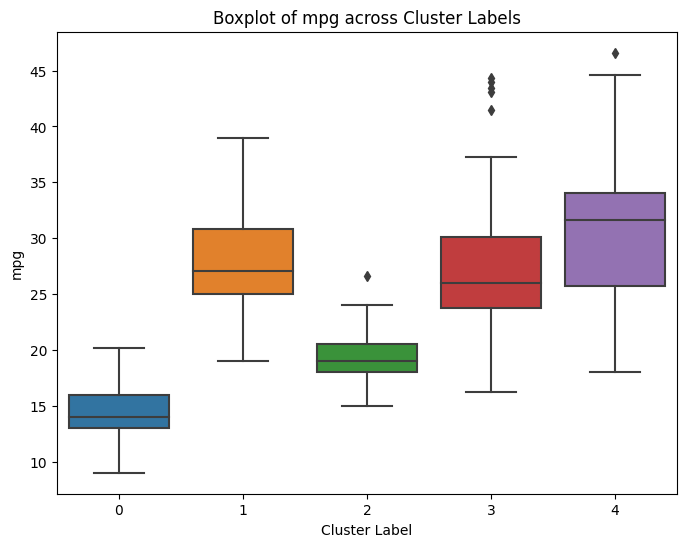

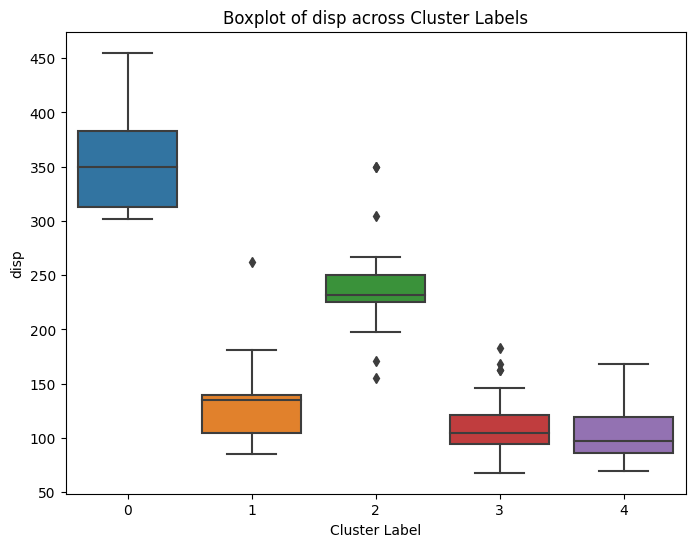

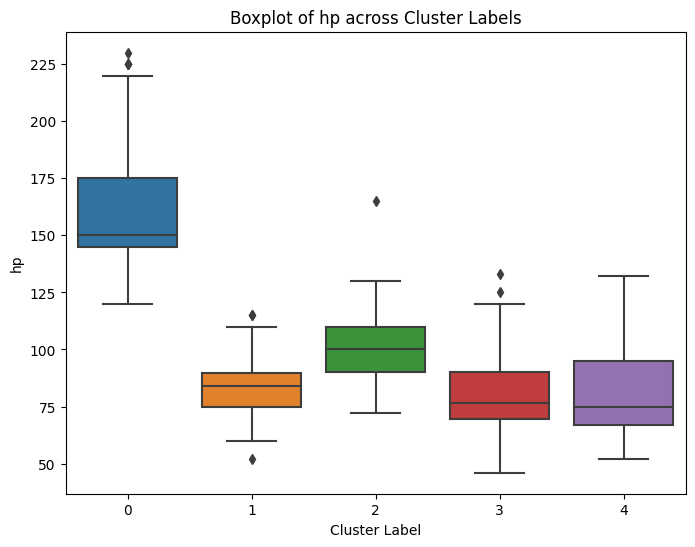

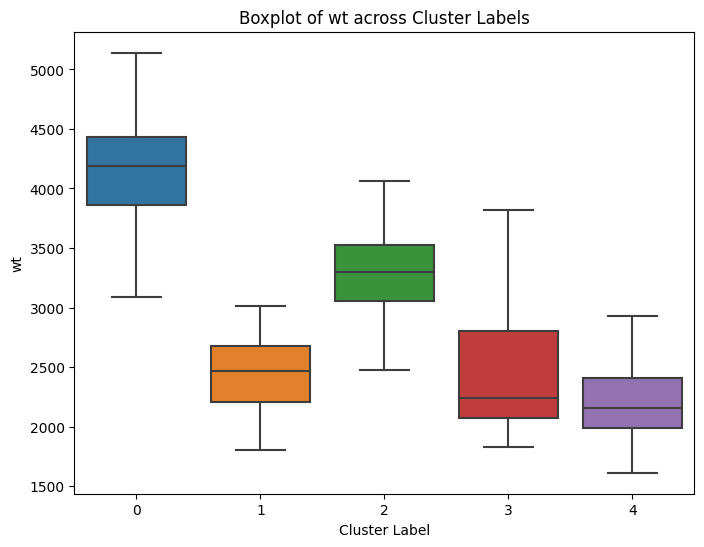

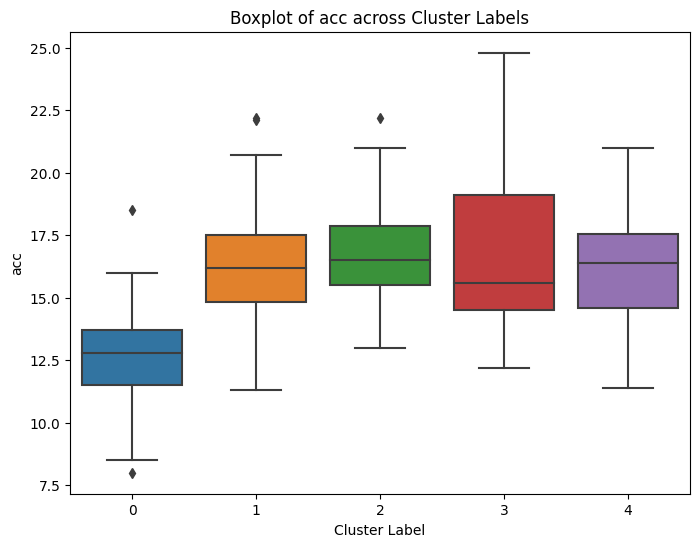

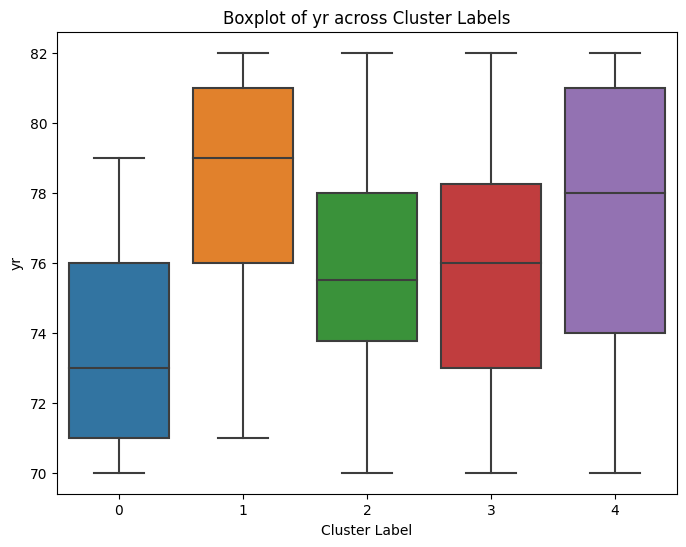

In [ ]:
# Selected columns for boxplots
selected_columns = ['mpg', 'disp', 'hp', 'wt', 'acc', 'yr']

# Create boxplots for each selected column across different cluster labels
for column in selected_columns:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x='Cluster_label', y=column, data=merged_data)
    plt.title(f'Boxplot of {column} across Cluster Labels')
    plt.xlabel('Cluster Label')
    plt.ylabel(column)
    plt.show()

Let's create a scatterplot to check relationship between wt and hp for across clusters.

In [ ]:
def plot_cluster_scatterplot(df, x_variable, y_variable):
    # Custom color palette with five different colors
    custom_palette = ['blue', 'red', 'green', '#FF33F9', '#33FFFF']  # Example colors
    #custom_palette = ['blue', 'red', 'green', 'pink']  # Example colors

    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=x_variable, y=y_variable, hue='Cluster_label', data=df, palette=custom_palette)
    plt.title(f'Scatter Plot of {x_variable} vs {y_variable} (Colored by Clusters)')
    plt.xlabel(x_variable)
    plt.ylabel(y_variable)
    plt.legend(title='Cluster')
    plt.grid(True)
    plt.show()

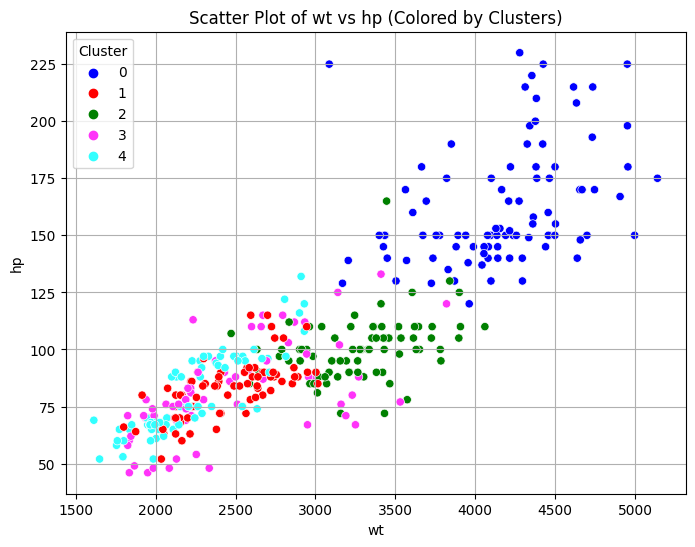

In [ ]:
plot_cluster_scatterplot(merged_data, 'wt', 'hp')

While clusters 0 and 2 appear distinct, there is quite an overlapping between clusters 1, 3 and 4 in the above scatterplot.

>> #### **G. Pass a new DataPoint and predict which cluster it belongs to.**


---



In [ ]:
# Suppress UserWarnings
warnings.filterwarnings("ignore", category=UserWarning)

In [ ]:
# Create a new data point as a DataFrame
new_data_point = pd.DataFrame({'mpg': [30], 'cyl': [4], 'disp': [120], 'hp': [100], 'wt': [2500], 'acc': [15], 'yr': [80], 'origin_1': [1],'origin_2': [0],'origin_3': [0]})

# Scale the new data point using the same scaler
new_data_point_scaled = sc.transform(new_data_point)

# Predict the cluster label for the scaled new data point
predicted_cluster = final_model.predict(new_data_point_scaled)

# Display the predicted cluster label
print("Predicted Cluster Label for the New Data Point:", predicted_cluster[0])

Predicted Cluster Label for the New Data Point: 1


# **PART B**


---



> **DOMAIN:** Automobile


---



> **CONTEXT:** The purpose is to classify a given silhouette as one of three types of vehicle, using a set of features extracted from the silhouette. The
vehicle may be viewed from one of many different angles.


---



> **DATA DESCRIPTION:** The data contains features extracted from the silhouette of vehicles in different angles. Four "Corgie" model vehicles were
used for the experiment: a double decker bus, Cheverolet van, Saab 9000 and an Opel Manta 400 cars. This particular combination of vehicles
was chosen with the expectation that the bus, van and either one of the cars would be readily distinguishable, but it would be more difficult to
distinguish between the cars.
* All the features are numeric i.e. geometric features extracted from the silhouette.


---



> **PROJECT OBJECTIVE:** Apply dimensionality reduction technique – PCA and train a model and compare relative results.


---



## **STEPS AND TASKS:**


---



> ### **1. Data Understanding & Cleaning:**


---



>> #### **A. Read ‘vehicle.csv’ and save as DataFrame.**


---



In [ ]:
import pandas as pd

In [ ]:
# Define the file path
file_path = '/content/drive/My Drive/GREAT LEARNING MATERIALS/Module 5: Unsupervised learning/Project/vehicle.csv'

# Read the CSV file into a DataFrame
vehicle_data = pd.read_csv(file_path)

In [ ]:
vehicle_data.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [ ]:
vehicle_data.shape

(846, 19)

In [ ]:
vehicle_data.dtypes

compactness                      int64
circularity                    float64
distance_circularity           float64
radius_ratio                   float64
pr.axis_aspect_ratio           float64
max.length_aspect_ratio          int64
scatter_ratio                  float64
elongatedness                  float64
pr.axis_rectangularity         float64
max.length_rectangularity        int64
scaled_variance                float64
scaled_variance.1              float64
scaled_radius_of_gyration      float64
scaled_radius_of_gyration.1    float64
skewness_about                 float64
skewness_about.1               float64
skewness_about.2               float64
hollows_ratio                    int64
class                           object
dtype: object

In [ ]:
vehicle_data['class'].value_counts()

car    429
bus    218
van    199
Name: class, dtype: int64

>> #### **B. Check percentage of missing values and impute with correct approach.**


---



In [ ]:
# Check for missing values in the DataFrame
missing_values = vehicle_data.isnull().sum()

# Calculate the percentage of missing values for each column
percentage_missing = (missing_values / len(vehicle_data)) * 100

In [ ]:
percentage_missing

compactness                    0.000000
circularity                    0.591017
distance_circularity           0.472813
radius_ratio                   0.709220
pr.axis_aspect_ratio           0.236407
max.length_aspect_ratio        0.000000
scatter_ratio                  0.118203
elongatedness                  0.118203
pr.axis_rectangularity         0.354610
max.length_rectangularity      0.000000
scaled_variance                0.354610
scaled_variance.1              0.236407
scaled_radius_of_gyration      0.236407
scaled_radius_of_gyration.1    0.472813
skewness_about                 0.709220
skewness_about.1               0.118203
skewness_about.2               0.118203
hollows_ratio                  0.000000
class                          0.000000
dtype: float64

There appears to be many missing values across several columns. Even though the percentage missing values is less than 1% in each column, there are 14 columns with missing values and hence we need to calculate total percentage of rows with at least one missing values.

In [ ]:
rows_with_missing = vehicle_data[vehicle_data.isnull().any(axis=1)]

In [ ]:
rows_with_missing.shape

(33, 19)

In [ ]:
percentage_missing_values=(rows_with_missing.shape[0]/vehicle_data.shape[0])*100
print('Percentage rows with missing values = ', percentage_missing_values)

Percentage rows with missing values =  3.900709219858156


There are 33 rows out of 846 with missing values which constitutes 4% of the data, which is significant. Hence we need to impute the missing values.

Let's check the entries with missing values.

In [ ]:
rows_with_missing

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
5,107,NaN,106.0,172.0,50.0,6,255.0,26.0,28.0,169,280.0,957.0,264.0,85.0,5.0,9.0,181.0,183,bus
9,93,44.0,98.0,NaN,62.0,11,183.0,36.0,22.0,146,202.0,505.0,152.0,64.0,4.0,14.0,195.0,204,car
19,101,56.0,100.0,215.0,NaN,10,208.0,32.0,24.0,169,227.0,651.0,223.0,74.0,6.0,5.0,186.0,193,car
35,100,46.0,NaN,172.0,67.0,9,157.0,43.0,20.0,150,170.0,363.0,184.0,67.0,17.0,7.0,192.0,200,van
66,81,43.0,68.0,125.0,57.0,8,149.0,46.0,19.0,146,169.0,323.0,172.0,NaN,NaN,18.0,179.0,184,bus
70,96,55.0,98.0,161.0,54.0,10,215.0,31.0,NaN,175,226.0,683.0,221.0,76.0,3.0,6.0,185.0,193,car
77,86,40.0,62.0,140.0,62.0,7,150.0,45.0,19.0,133,165.0,330.0,173.0,NaN,2.0,3.0,180.0,185,car
78,104,52.0,94.0,NaN,66.0,5,208.0,31.0,24.0,161,227.0,666.0,218.0,76.0,11.0,4.0,193.0,191,bus
105,108,NaN,103.0,202.0,64.0,10,220.0,30.0,25.0,168,NaN,711.0,214.0,73.0,11.0,NaN,188.0,199,car
118,85,NaN,NaN,128.0,56.0,8,150.0,46.0,19.0,144,168.0,324.0,173.0,82.0,9.0,14.0,180.0,184,bus


All the columns are numerical features except the class column and the missing values are distributed across all classes. Hence we will impute the numerical features with classwise central values.

Let's check the 5 point summary of the data.

In [ ]:
vehicle_data.describe().T

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.0,119.0
circularity,841.0,44.828775,6.152172,33.0,40.00,44.0,49.0,59.0
distance_circularity,842.0,82.110451,15.778292,40.0,70.00,80.0,98.0,112.0
radius_ratio,840.0,168.888095,33.520198,104.0,141.00,167.0,195.0,333.0
pr.axis_aspect_ratio,844.0,61.678910,7.891463,47.0,57.00,61.0,65.0,138.0
max.length_aspect_ratio,846.0,8.567376,4.601217,2.0,7.00,8.0,10.0,55.0
scatter_ratio,845.0,168.901775,33.214848,112.0,147.00,157.0,198.0,265.0
elongatedness,845.0,40.933728,7.816186,26.0,33.00,43.0,46.0,61.0
pr.axis_rectangularity,843.0,20.582444,2.592933,17.0,19.00,20.0,23.0,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.0,188.0


##### Lets check the KDE distribution by class for the features

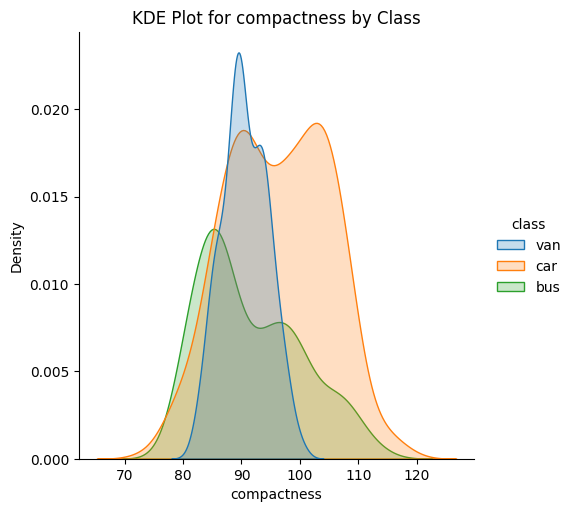

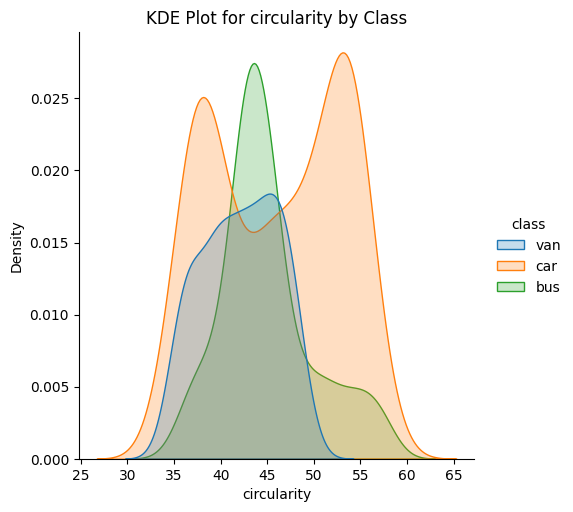

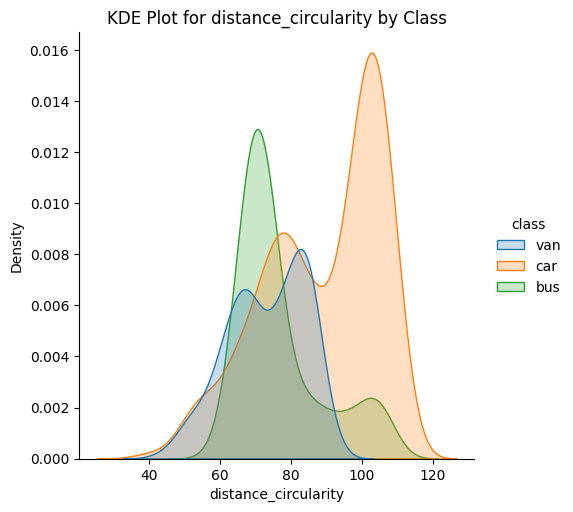

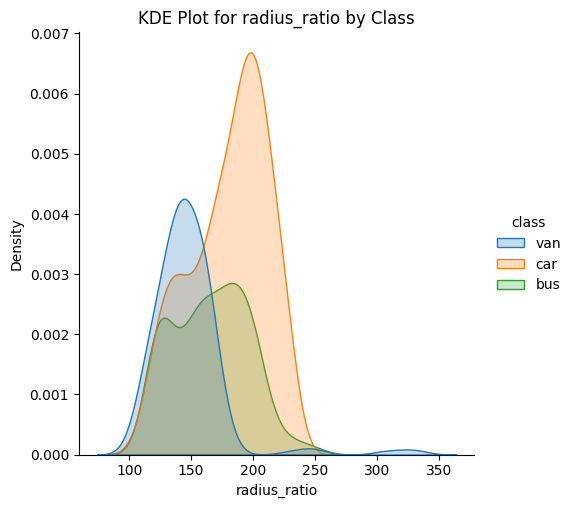

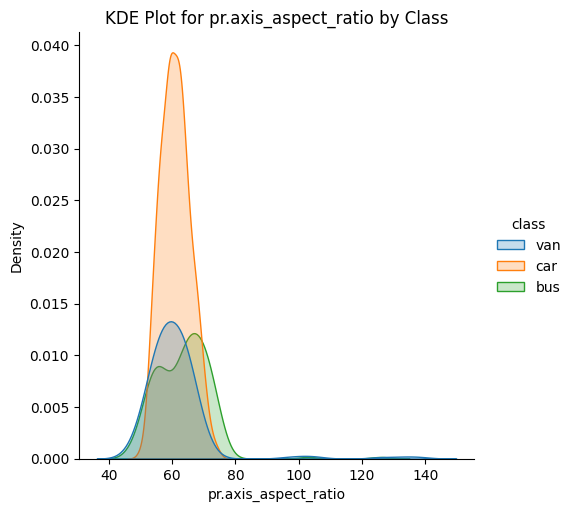

...

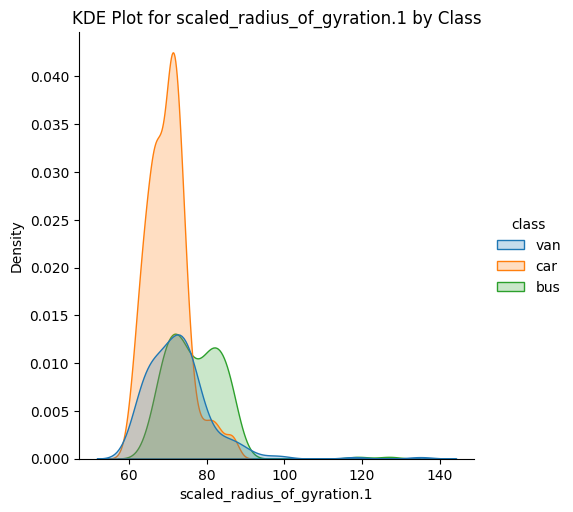

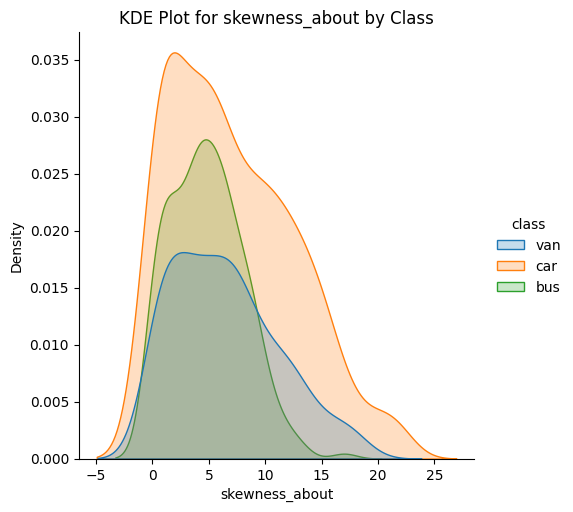

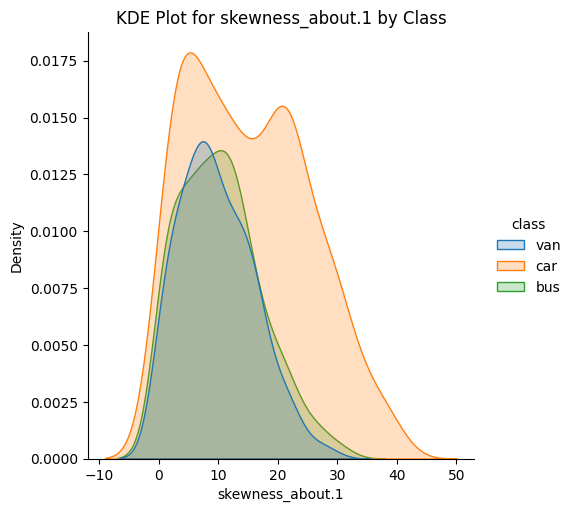

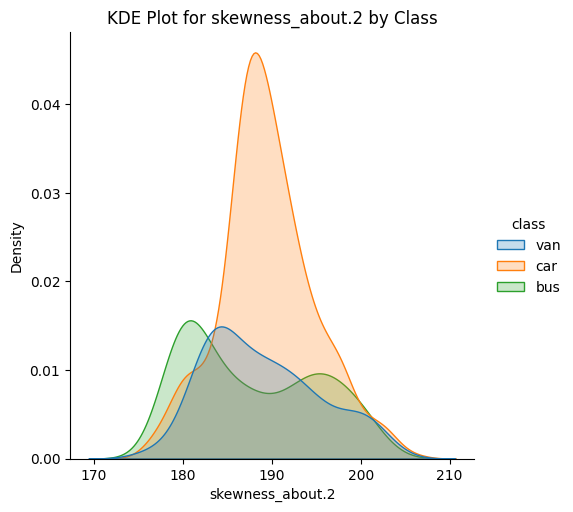

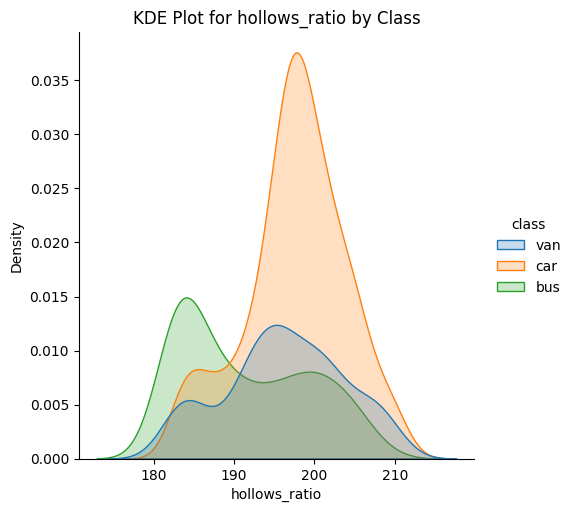

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'vehicle_data' contains your DataFrame

# Filter out numeric columns
numeric_cols = vehicle_data.select_dtypes(include=['float64', 'int64']).columns

# Create KDE plots for each numerical column based on 'class'
for col in numeric_cols:
    sns.displot(data=vehicle_data, x=col, hue='class', kind='kde', fill=True)
    plt.title(f'KDE Plot for {col} by Class')
    plt.show()

##### Lets check the pairplot

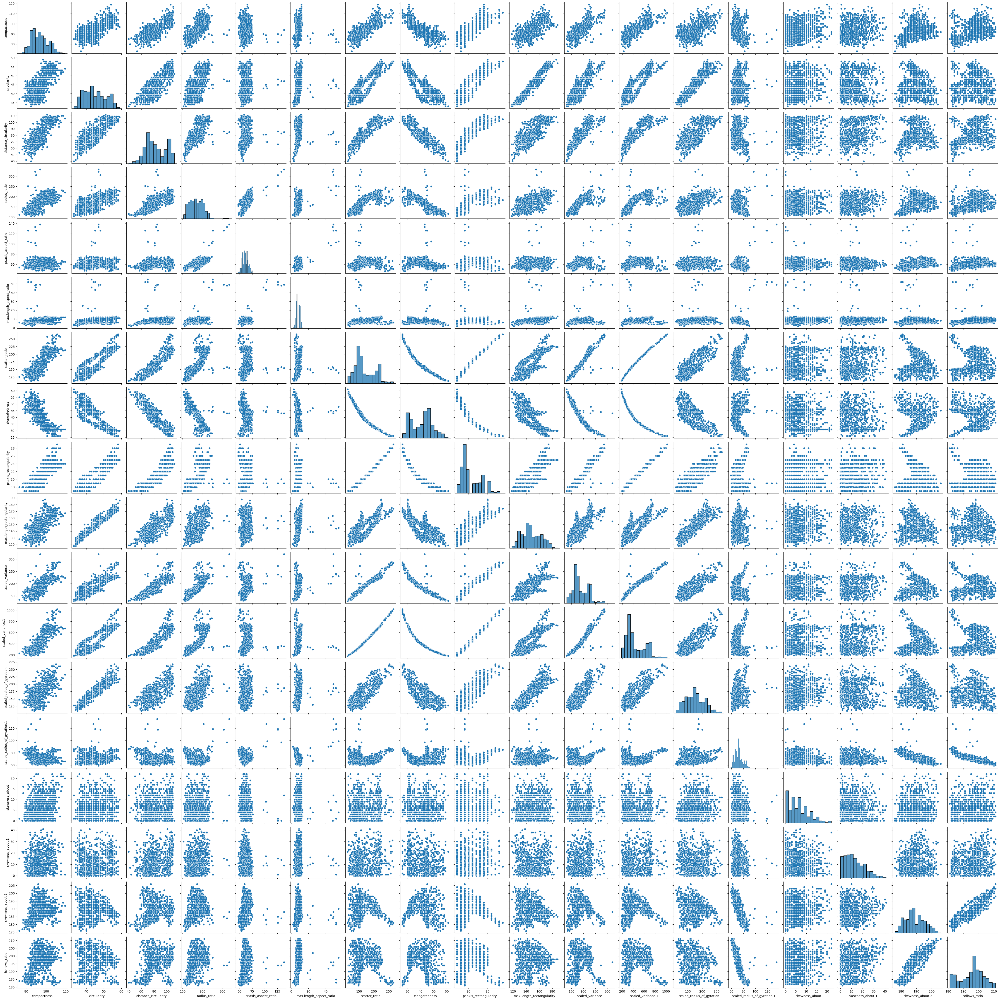

In [ ]:
sns.pairplot(vehicle_data)

Several columns are correlated with each other, indicating multicollinerity.

All some columns seem to be evenly distributed with little skewness, others are skewed or unsymmetrical.

Let's impute the missing values in each column with corresponding classwise median.

In [ ]:
import numpy as np
# Filter out non-numeric columns
numeric_cols = vehicle_data.select_dtypes(include=[np.number]).columns

# Calculate medians for each column within each 'class' group, considering only numeric columns
medians = vehicle_data.groupby('class')[numeric_cols].median()

# Impute missing values with corresponding median for each class, considering only numeric columns
for col in numeric_cols:
    # Calculate median values for the column 'col' within each 'class'
    median_values = vehicle_data.groupby('class')[col].median()

    # Replace missing values in 'col' based on the corresponding class median
    vehicle_data[col] = vehicle_data.apply(lambda row: median_values[row['class']]
                                           if pd.isnull(row[col]) else row[col], axis=1)

In [ ]:
# Check for missing values in the DataFrame
missing_values = vehicle_data.isnull().sum()

# Calculate the percentage of missing values for each column
percentage_missing = (missing_values / len(vehicle_data)) * 100
percentage_missing

compactness                    0.0
circularity                    0.0
distance_circularity           0.0
radius_ratio                   0.0
pr.axis_aspect_ratio           0.0
max.length_aspect_ratio        0.0
scatter_ratio                  0.0
elongatedness                  0.0
pr.axis_rectangularity         0.0
max.length_rectangularity      0.0
scaled_variance                0.0
scaled_variance.1              0.0
scaled_radius_of_gyration      0.0
scaled_radius_of_gyration.1    0.0
skewness_about                 0.0
skewness_about.1               0.0
skewness_about.2               0.0
hollows_ratio                  0.0
class                          0.0
dtype: float64

All the missing values have been imputed.

>> #### **C. Visualize a Pie-chart and print percentage of values for variable ‘class’.**


---



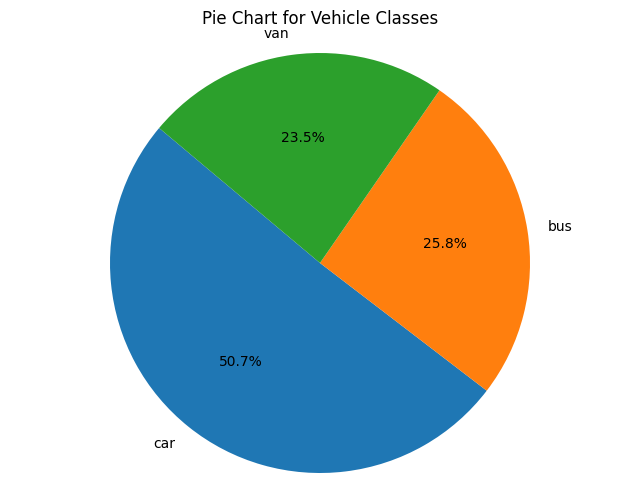

In [ ]:
import matplotlib.pyplot as plt

# Calculate the value counts for the 'class' variable
class_counts = vehicle_data['class'].value_counts()

# Plotting a pie chart for the 'class' variable
plt.figure(figsize=(8, 6))  # Set the figure size
plt.pie(class_counts, labels=class_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Pie Chart for Vehicle Classes')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle

# Show the pie chart
plt.show()

In [ ]:
# Print the percentage of values for the 'class' variable
print("Percentage of values for the 'class' variable:")
print((class_counts / len(vehicle_data)) * 100)

Percentage of values for the 'class' variable:
car    50.709220
bus    25.768322
van    23.522459
Name: class, dtype: float64


>> #### **D. Check for duplicate rows in the data and impute with correct approach.**


---



In [ ]:
duplicate_rows = vehicle_data[vehicle_data.duplicated()]

In [ ]:
# Count the number of duplicate rows
num_duplicates = duplicate_rows.sum()

In [ ]:
num_duplicates

compactness                    0.0
circularity                    0.0
distance_circularity           0.0
radius_ratio                   0.0
pr.axis_aspect_ratio           0.0
max.length_aspect_ratio        0.0
scatter_ratio                  0.0
elongatedness                  0.0
pr.axis_rectangularity         0.0
max.length_rectangularity      0.0
scaled_variance                0.0
scaled_variance.1              0.0
scaled_radius_of_gyration      0.0
scaled_radius_of_gyration.1    0.0
skewness_about                 0.0
skewness_about.1               0.0
skewness_about.2               0.0
hollows_ratio                  0.0
class                          0.0
dtype: float64

There are no duplicate rows in the dataset.

> ### **2. Data Preparation:**


---



>> #### **A. Split data into X and Y. [Train and Test optional]**


---



In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X = vehicle_data.drop('class', axis=1)  # Features
Y = vehicle_data['class']  # Target variable

>> #### **B. Standardize the Data.**


---



In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_standardized = scaler.fit_transform(X)

> ### **3. Model Building:**


---



>> #### **A. Train a base Classification model using SVM.**


---



In [ ]:
from sklearn.svm import SVC

svc = SVC(random_state=42)
svc.fit(X_train_standardized, Y)

SVC(random_state=42)

>> #### **B. Print Classification metrics for train data.**


---



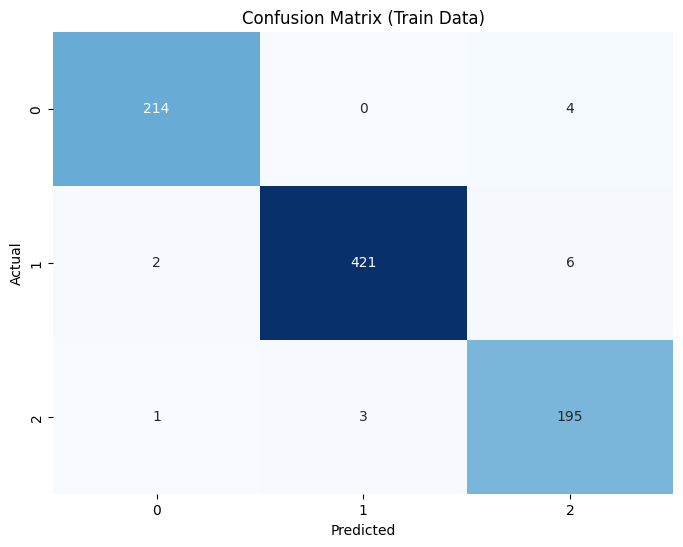

Classification Report (Train Data):
               precision    recall  f1-score   support

         bus       0.99      0.98      0.98       218
         car       0.99      0.98      0.99       429
         van       0.95      0.98      0.97       199

    accuracy                           0.98       846
   macro avg       0.98      0.98      0.98       846
weighted avg       0.98      0.98      0.98       846

Accuracy (Train Data): 0.9810874704491725
Weighted Precision (Train Data): 0.9813752726755863
Weighted Recall (Train Data): 0.9810874704491725
Weighted F1-score (Train Data): 0.9811627367176216


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, f1_score
import seaborn as sns
import matplotlib.pyplot as plt

# Predict on the training set
Y_train_pred = svc.predict(X_train_standardized)

# Confusion matrix in heatmap form
conf_matrix = confusion_matrix(Y, Y_train_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='d', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Train Data)')
plt.show()

# Classification report
class_report = classification_report(Y, Y_train_pred)
print("Classification Report (Train Data):\n", class_report)

# Accuracy
accuracy = accuracy_score(Y, Y_train_pred)
print("Accuracy (Train Data):", accuracy)

# Calculate weighted average for precision, recall, and F1-score
weighted_precision = precision_score(Y, Y_train_pred, average='weighted')
weighted_recall = recall_score(Y, Y_train_pred, average='weighted')
weighted_f1 = f1_score(Y, Y_train_pred, average='weighted')

print("Weighted Precision (Train Data):", weighted_precision)
print("Weighted Recall (Train Data):", weighted_recall)
print("Weighted F1-score (Train Data):", weighted_f1)

In [ ]:
train_metrics_df = pd.DataFrame(columns=['Model Name', 'Accuracy (Train)', 'Precision (Train)', 'F1 (Train)', 'Recall (Train)'])
# Set the evaluation metrics in the DataFrame
# Add a row for the model to the DataFrame
train_metrics_df = train_metrics_df.append({'Model Name': 'SVC (default)',
                                          'Accuracy (Train)': accuracy,
                                          'Precision (Train)': weighted_precision,
                                          'F1 (Train)': weighted_f1,
                                          'Recall (Train)': weighted_recall}, ignore_index=True)

In [ ]:
train_metrics_df

,Model Name,Accuracy (Train),Precision (Train),F1 (Train),Recall (Train)
0,SVC (default),0.981087,0.981375,0.981163,0.981087


>> #### **C. Apply PCA on the data with 10 components.**


---



In [ ]:
from sklearn.decomposition import PCA

# Apply PCA with 10 components
pca10 = PCA(n_components=10)
X_train_pca10 = pca10.fit_transform(X_train_standardized)

In [ ]:
covMatrix = np.cov(X_train_standardized,rowvar=False)
covMatrix

array([[ 1.00118343,  0.68636217,  0.79059726,  0.69053363,  0.09198453,
         0.14842463,  0.81247773, -0.78905557,  0.81440865,  0.67694334,
         0.76351002,  0.81833828,  0.58575426, -0.25053864,  0.23701356,
         0.15789336,  0.29887839,  0.36598446],
       [ 0.68636217,  1.00118343,  0.79280285,  0.62276075,  0.15444546,
         0.25188188,  0.84770943, -0.8218075 ,  0.84576918,  0.96297741,
         0.79520193,  0.84019363,  0.92731344,  0.05233142,  0.14471964,
        -0.01144512, -0.10494782,  0.04657999],
       [ 0.79059726,  0.79280285,  1.00118343,  0.76908912,  0.15929452,
         0.26536555,  0.90342716, -0.91177521,  0.89389345,  0.77443553,
         0.86160468,  0.8884694 ,  0.70519293, -0.22829105,  0.11406664,
         0.2671402 ,  0.14777577,  0.33545957],
       [ 0.69053363,  0.62276075,  0.76908912,  1.00118343,  0.66406299,
         0.44997021,  0.73468321, -0.7910345 ,  0.70996999,  0.57016627,
         0.79519036,  0.72247019,  0.53726381, -0.182

In [ ]:
# Explained variance ratio
pca10.explained_variance_ratio_

array([0.52200175, 0.16743902, 0.10556694, 0.06548539, 0.05093994,
       0.0299648 , 0.01990839, 0.01234785, 0.00885312, 0.0050885 ])

In [ ]:
#eigen vectors
pca10.components_

array([[ 0.2753037 ,  0.29325519,  0.30441626,  0.26782469,  0.0805625 ,
         0.0972205 ,  0.31660233, -0.3139243 ,  0.31413875,  0.28273438,
         0.30922084,  0.31446567,  0.27186736, -0.02101268,  0.04161709,
         0.05863285,  0.03028069,  0.07425711],
       [-0.12669982,  0.12579803, -0.07401641, -0.18966427, -0.12205294,
         0.01091362,  0.04845086,  0.0123919 ,  0.06097955,  0.11654734,
         0.06187114,  0.0532452 ,  0.2095652 ,  0.48855846, -0.05561537,
        -0.12375461, -0.54084674, -0.54005434],
       [-0.12002144, -0.02451301, -0.05564819,  0.27435192,  0.64223442,
         0.59201696, -0.09795856,  0.05747915, -0.10969794, -0.01664029,
         0.05607413, -0.10884896, -0.03117432,  0.28616193, -0.11504784,
        -0.07564649,  0.00903675,  0.03969779],
       [ 0.07870867,  0.18867283, -0.07133024, -0.04217753,  0.03231283,
         0.03050283, -0.09624839,  0.08376016, -0.09192214,  0.1887135 ,
        -0.12132561, -0.09043749,  0.20083089, -0.066

>> #### **D. Visualize Cumulative Variance Explained with Number of Components.**


---



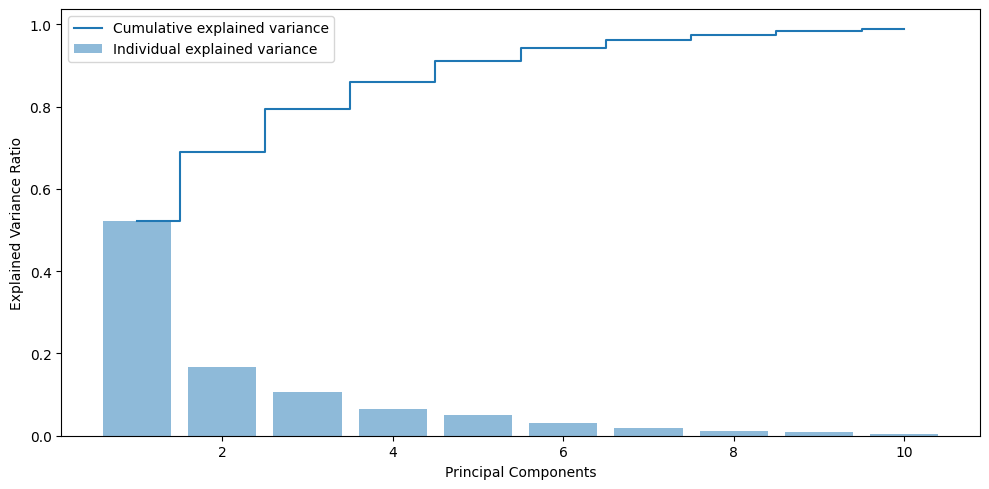

In [ ]:
# Calculate cumulative explained variance
cumulative_explained_variance = np.cumsum(pca10.explained_variance_ratio_)

# Plotting variance explained by the principal components and the cumulative variance explained
plt.figure(figsize=(10, 5))

# Plotting individual explained variance
plt.bar(range(1, len(pca10.explained_variance_ratio_) + 1), pca10.explained_variance_ratio_, alpha=0.5, align='center', label='Individual explained variance')

# Plotting cumulative explained variance
plt.step(range(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, where='mid', label='Cumulative explained variance')

plt.ylabel('Explained Variance Ratio')
plt.xlabel('Principal Components')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

>> #### **E. Draw a horizontal line on the above plot to highlight the threshold of 90%.**


---



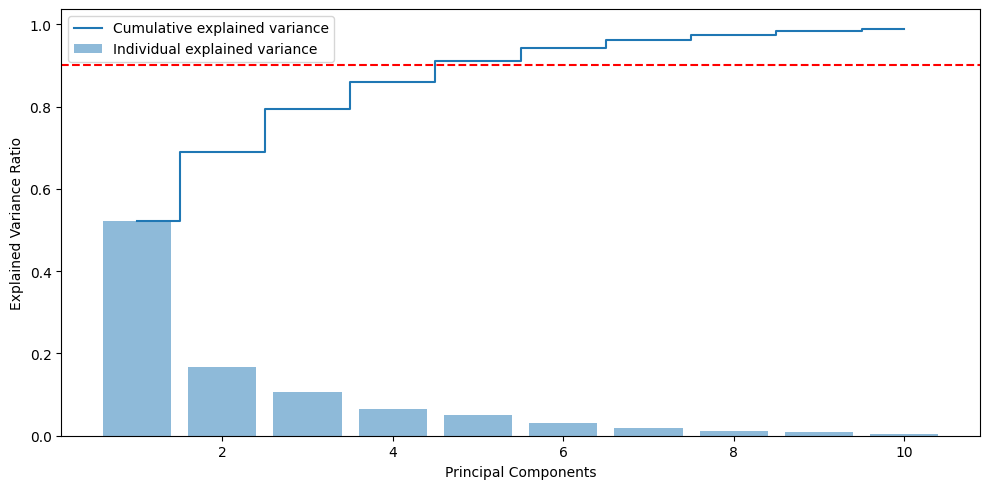

In [ ]:
# Plotting variance explained by the principal components and the cumulative variance explained
plt.figure(figsize=(10, 5))

# Plotting individual explained variance
plt.bar(range(1, len(pca10.explained_variance_ratio_) + 1), pca10.explained_variance_ratio_, alpha=0.5, align='center', label='Individual explained variance')

# Plotting cumulative explained variance
plt.step(range(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, where='mid', label='Cumulative explained variance')

plt.ylabel('Explained Variance Ratio')
plt.xlabel('Principal Components')
plt.legend(loc='best')
plt.tight_layout()

# Adding a horizontal line at 90% cumulative explained variance
plt.axhline(y=0.90, color='r', linestyle='--', label='90% Threshold')

plt.show()

>> #### **F. Apply PCA on the data. This time Select Minimum Components with 90% or above variance explained.**


---



Based on the figure, selecting 5 components is enough to explain more than 90% variance in the data.

In [ ]:
pca5 = PCA(n_components=5)
pca5.fit(X_train_standardized)

PCA(n_components=5)

In [ ]:
pca5.components_

array([[ 0.2753037 ,  0.29325519,  0.30441626,  0.26782469,  0.0805625 ,
         0.0972205 ,  0.31660233, -0.3139243 ,  0.31413875,  0.28273438,
         0.30922084,  0.31446567,  0.27186736, -0.02101268,  0.04161709,
         0.05863285,  0.03028069,  0.07425711],
       [-0.12669982,  0.12579803, -0.07401641, -0.18966427, -0.12205294,
         0.01091362,  0.04845086,  0.0123919 ,  0.06097955,  0.11654734,
         0.06187114,  0.0532452 ,  0.2095652 ,  0.48855846, -0.05561537,
        -0.12375461, -0.54084674, -0.54005434],
       [-0.12002144, -0.02451301, -0.05564819,  0.27435192,  0.64223442,
         0.59201696, -0.09795856,  0.05747915, -0.10969794, -0.01664029,
         0.05607413, -0.10884896, -0.03117432,  0.28616193, -0.11504784,
        -0.07564649,  0.00903675,  0.03969779],
       [ 0.07870867,  0.18867283, -0.07133024, -0.04217753,  0.03231283,
         0.03050283, -0.09624839,  0.08376016, -0.09192214,  0.1887135 ,
        -0.12132561, -0.09043749,  0.20083089, -0.066

In [ ]:
pca5.explained_variance_ratio_

array([0.52200175, 0.16743902, 0.10556694, 0.06548539, 0.05093994])

>> #### **G. Train SVM model on components selected from above step.**


---



In [ ]:
Xpca5 = pca5.transform(X_train_standardized)

# Train an SVM classifier on the transformed data
svm_model = SVC(random_state=42)
svm_model.fit(Xpca5, Y)  # Y is assumed to be your target variable

SVC(random_state=42)

>> #### **H. Print Classification metrics for train data of above model and share insights.**


---



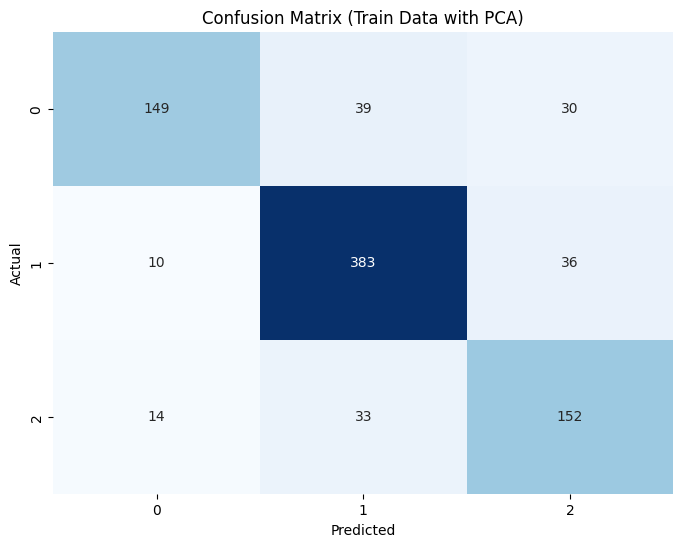

Classification Report (Train Data with PCA):
               precision    recall  f1-score   support

         bus       0.86      0.68      0.76       218
         car       0.84      0.89      0.87       429
         van       0.70      0.76      0.73       199

    accuracy                           0.81       846
   macro avg       0.80      0.78      0.79       846
weighted avg       0.81      0.81      0.81       846

Accuracy (Train Data with PCA): 0.8085106382978723
Weighted Precision (Train Data with PCA): 0.8127940954205595
Weighted Recall (Train Data with PCA): 0.8085106382978723
Weighted F1-score (Train Data with PCA): 0.8072789269989751


In [ ]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Predict on the training set using SVM model trained on PCA-transformed data
Y_train_pred_pca5 = svm_model.predict(Xpca5)

# Confusion matrix in heatmap form
conf_matrix_pca = confusion_matrix(Y, Y_train_pred_pca5)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_pca, annot=True, cmap='Blues', fmt='d', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Train Data with PCA)')
plt.show()

# Classification report
class_report_pca = classification_report(Y, Y_train_pred_pca5)
print("Classification Report (Train Data with PCA):\n", class_report_pca)

# Accuracy
accuracy_pca = accuracy_score(Y, Y_train_pred_pca5)
print("Accuracy (Train Data with PCA):", accuracy_pca)

# Calculate weighted average for precision, recall, and F1-score
weighted_precision_pca = precision_score(Y, Y_train_pred_pca5, average='weighted')
weighted_recall_pca = recall_score(Y, Y_train_pred_pca5, average='weighted')
weighted_f1_pca = f1_score(Y, Y_train_pred_pca5, average='weighted')

print("Weighted Precision (Train Data with PCA):", weighted_precision_pca)
print("Weighted Recall (Train Data with PCA):", weighted_recall_pca)
print("Weighted F1-score (Train Data with PCA):", weighted_f1_pca)

In [ ]:
# Add a row for the model to the DataFrame
train_metrics_df = train_metrics_df.append({'Model Name': 'SVC (PCA 5 components)',
                                          'Accuracy (Train)': accuracy_pca,
                                          'Precision (Train)': weighted_precision_pca,
                                          'F1 (Train)': weighted_f1_pca,
                                          'Recall (Train)': weighted_recall_pca}, ignore_index=True)

In [ ]:
train_metrics_df

,Model Name,Accuracy (Train),Precision (Train),F1 (Train),Recall (Train)
0,SVC (default),0.981087,0.981375,0.981163,0.981087
1,SVC (PCA 5 components),0.808511,0.812794,0.807279,0.808511


Reducing the dimensionality from 18 to 5 resulted in significant decline in accuracy and other performance metrics, suggesting information loss. However, the reduced score of 80% is still decent. The number of dimensions have reduced from 18 to 5. The pairplot diagram indicated relationship among several variables and hence the multicollinearity issues in the original data may have been resolved with 5 independent dimensions and we might have a more robust model with a decent performance of 80%, compared to the previous model.

> ### **4. Performance Improvement:**


---



>> #### **A. Train another SVM on the components out of PCA. Tune the parameters to improve performance.**


---



In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC

# Define the parameter grid to search through
param_grid = {
    'C': [0.1, 1, 10, 100],
    'gamma': [1, 0.1, 0.01, 0.001],
    'kernel': ['rbf', 'linear', 'poly', 'sigmoid']
}

# Create SVM classifier
svm = SVC(random_state=42)

# Create GridSearchCV to tune hyperparameters
grid_search = GridSearchCV(estimator=svm, param_grid=param_grid, cv=5, verbose=3)

# Fit the GridSearchCV on the PCA-transformed data
grid_search.fit(Xpca5, Y)  # Xpca5 contains PCA-transformed data

Fitting 5 folds for each of 64 candidates, totalling 320 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.559 total time=   0.0s
[CV 2/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.548 total time=   0.0s
[CV 3/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.570 total time=   0.0s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.563 total time=   0.0s
[CV 5/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.570 total time=   0.0s
[CV 1/5] END .....C=0.1, gamma=1, kernel=linear;, score=0.676 total time=   0.0s
[CV 2/5] END .....C=0.1, gamma=1, kernel=linear;, score=0.615 total time=   0.0s
[CV 3/5] END .....C=0.1, gamma=1, kernel=linear;, score=0.607 total time=   0.0s
[CV 4/5] END .....C=0.1, gamma=1, kernel=linear;, score=0.696 total time=   0.0s
[CV 5/5] END .....C=0.1, gamma=1, kernel=linear;, score=0.726 total time=   0.0s
[CV 1/5] END .......C=0.1, gamma=1, kernel=poly;, score=0.699 total time=   0.6s
[CV 2/5] END .......C=0.1, gamma=1, kernel=poly

GridSearchCV(cv=5, estimator=SVC(random_state=42),
             param_grid={'C': [0.1, 1, 10, 100], 'gamma': [1, 0.1, 0.01, 0.001],
                         'kernel': ['rbf', 'linear', 'poly', 'sigmoid']},
             verbose=3)

>> #### **B. Share best Parameters observed from above step.**


---



In [ ]:
# Get the best parameters found by GridSearchCV
best_params = grid_search.best_params_
print("Best Parameters:", best_params)

# Get the best model obtained by GridSearchCV
best_model = grid_search.best_estimator_

Best Parameters: {'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}


The best SVM model based on performance in the GridSearchCV is for C=10, gamma=0.1 and kernel='rbf'.

>> #### **C. Print Classification metrics for train data of above model and share relative improvement in performance in all the models along with insights.**


---



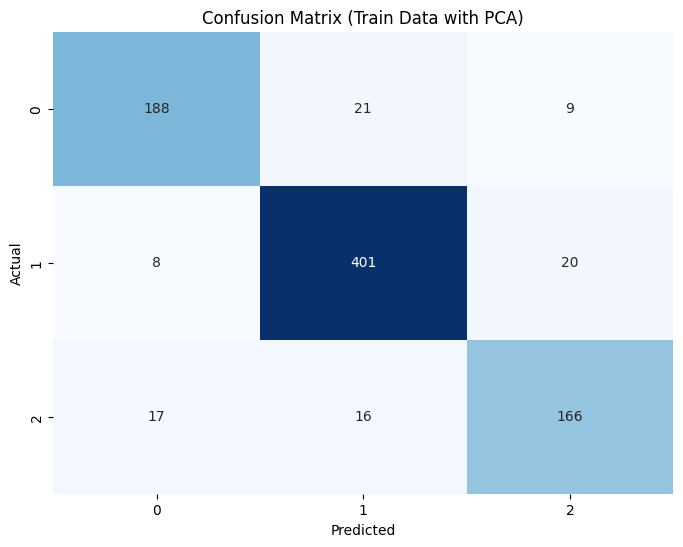

Classification Report (Train Data with PCA):
               precision    recall  f1-score   support

         bus       0.88      0.86      0.87       218
         car       0.92      0.93      0.93       429
         van       0.85      0.83      0.84       199

    accuracy                           0.89       846
   macro avg       0.88      0.88      0.88       846
weighted avg       0.89      0.89      0.89       846

Accuracy (Train Data with PCA): 0.892434988179669
Weighted Precision (Train Data with PCA): 0.8919368176331408
Weighted Recall (Train Data with PCA): 0.892434988179669
Weighted F1-score (Train Data with PCA): 0.8920846618297755


In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Create an SVM classifier with the best parameters
svm_model_pca = SVC(C=10, gamma=0.1, kernel='rbf', random_state=42)

# Train the SVM model on PCA-transformed data
svm_model_pca.fit(Xpca5, Y)

# Predict on the training set using SVM model trained on PCA-transformed data
Y_train_pred_pca5 = svm_model_pca.predict(Xpca5)

# Confusion matrix in heatmap form
conf_matrix_pca = confusion_matrix(Y, Y_train_pred_pca5)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_pca, annot=True, cmap='Blues', fmt='d', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Train Data with PCA)')
plt.show()

# Classification report
class_report_pca = classification_report(Y, Y_train_pred_pca5)
print("Classification Report (Train Data with PCA):\n", class_report_pca)

# Accuracy
accuracy_pca = accuracy_score(Y, Y_train_pred_pca5)
print("Accuracy (Train Data with PCA):", accuracy_pca)

# Calculate weighted average for precision, recall, and F1-score
weighted_precision_pca = precision_score(Y, Y_train_pred_pca5, average='weighted')
weighted_recall_pca = recall_score(Y, Y_train_pred_pca5, average='weighted')
weighted_f1_pca = f1_score(Y, Y_train_pred_pca5, average='weighted')

print("Weighted Precision (Train Data with PCA):", weighted_precision_pca)
print("Weighted Recall (Train Data with PCA):", weighted_recall_pca)
print("Weighted F1-score (Train Data with PCA):", weighted_f1_pca)

In [ ]:
# Add a row for the model to the DataFrame
train_metrics_df = train_metrics_df.append({'Model Name': 'SVC (PCA 5 components Tuned)',
                                          'Accuracy (Train)': accuracy_pca,
                                          'Precision (Train)': weighted_precision_pca,
                                          'F1 (Train)': weighted_f1_pca,
                                          'Recall (Train)': weighted_recall_pca}, ignore_index=True)

In [ ]:
train_metrics_df

,Model Name,Accuracy (Train),Precision (Train),F1 (Train),Recall (Train)
0,SVC (default),0.981087,0.981375,0.981163,0.981087
1,SVC (PCA 5 components),0.808511,0.812794,0.807279,0.808511
2,SVC (PCA 5 components Tuned),0.892435,0.891937,0.892085,0.892435


**Observation**
* The model, without PCA and using default parameters, demonstrates exceptional performance of 98% across all metrics. It achieves high accuracy and balanced precision, recall, and F1-score for all vehicle classes ('bus', 'car', 'van'). However, the number of dimensions are 18 and the pairplot indicates multicollinarity.
* PCA reduction to 5 components led to a noticeable drop in performance to 80% compared to the default model. The reduced feature space resulted in decreased accuracy and slightly lower precision, recall, and F1-score, indicating the loss of crucial information necessary for precise classification. However the performance score of 80% is quite decent given we have only 5 dimensions  which are independent of each other.
* After hyperparameter tuning, the model's performance improved significantly compared to the PCA-reduced model from 80% to 89%. However, it didn't surpass the performance of the default model. The tuned model demonstrates good accuracy and balanced precision, recall, and F1-score across vehicle classes, indicating a notable improvement from the initial PCA reduction.


> ### **5. Data Understanding & Cleaning:**


---



>> #### **A. Explain pre-requisite/assumptions of PCA.**


---



1. **Linearity:** PCA assumes linear relationships between variables.
2. **Numeric Data:** It works with numerical data, requiring preprocessing for categorical or ordinal data.
3. **Homoscedasticity:** Assumes roughly equal variance across dimensions.
4. **Centering and Scaling:** Data is centered at the origin and often needs standardization.
5. **Variance Indicates Importance:** Higher variances signify greater importance of features.
6. **Orthogonal Transformation:** Principal components are uncorrelated and orthogonal.
7. **Linear Components:** PCA represents data using linear combinations of variables.

The vehicle dataset contains 18 columns which is too many number of dimensions. Moreover the pairplot indicates that several columns are correlated with each other suggesting multicollinearity. Hence PCA was necessary for this dataset. Using PCA we were able to reduce the dimensionality from 18 to 5 and still obtain a great accuracy score of 89%.

>> #### **B. Explain advantages and limitations of PCA.**


---



**Advantages of PCA:**

1. **Dimensionality Reduction:** Reduces high-dimensional data while retaining information.
2. **Feature Extraction:** Identifies essential patterns and removes redundancy.
3. **Collinearity Reduction:** Addresses multicollinearity issues.
4. **Visualization:** Enables visual representation in lower dimensions.
5. **Noise Filtering:** Filters out noise and focuses on primary variations.


**Limitations of PCA:**
1. **Linearity Assumption:** Requires linear relationships between variables.
2. **Information Loss:** May lose some details during dimension reduction.
3. **Interpretability:** Principal components might be hard to interpret.
4. **Scaling Sensitivity:** Sensitive to data scaling methods.
5. **Outlier Impact:** Outliers can distort principal components.
6. **Computationally Intensive:** Can be resource-intensive for large datasets.